In [16]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
from matplotlib import colors as mcolors

import scanpy as sc
import squidpy as sq
import cellcharter as cc
import scvi

from pandas.api.types import is_numeric_dtype, is_categorical_dtype
from scipy.sparse import issparse


# ------------------------------------------------------------------
# 1) Define and apply course + region + sample_id order
# ------------------------------------------------------------------
course_order = [
    "MOG CFA",
    "early onset",
    "chronic peak",
    "chronic long",

    "PLP CFA",
    "non symptomatic",
    "monophasic",

    "onset I",
    "onset II",
    "peak I",
    "remitt I",
    "peak II",
    "remitt II",
    "peak III",
]

region_order = ["L", "T", "C"]


def apply_course_region_and_sample_order(ad, sample_key="sample_id"):
    """Make ad.obs['course'], ad.obs['region'], and ad.obs[sample_key] ordered categoricals."""
    # --- course ---
    if "course" in ad.obs.columns:
        ad.obs["course"] = ad.obs["course"].astype(
            pd.CategoricalDtype(categories=course_order, ordered=True)
        )

    # --- region ---
    if "region" in ad.obs.columns:
        ad.obs["region"] = ad.obs["region"].astype(
            pd.CategoricalDtype(categories=region_order, ordered=True)
        )

    # --- sample_id ordered by (course, region, sample_id) ---
    if (
        sample_key in ad.obs.columns
        and "course" in ad.obs.columns
        and "region" in ad.obs.columns
    ):
        tmp = (
            ad.obs[[sample_key, "course", "region"]]
            .drop_duplicates()
            .dropna(subset=["course", "region"])
            .copy()
        )

        tmp["course"] = tmp["course"].astype(
            pd.CategoricalDtype(categories=course_order, ordered=True)
        )
        tmp["region"] = tmp["region"].astype(
            pd.CategoricalDtype(categories=region_order, ordered=True)
        )

        tmp = tmp.sort_values(["course", "region", sample_key])
        sample_order = tmp[sample_key].tolist()

        ad.obs[sample_key] = ad.obs[sample_key].astype(
            pd.CategoricalDtype(categories=sample_order, ordered=True)
        )

        ad.uns[f"{sample_key}_order_by_course_region"] = sample_order

    return ad


# ------------------------------------------------------------------
# 2) Plot function (obs + genes, ordered groupby, shared vmin/vmax)
# ------------------------------------------------------------------
def plot_spatial_compact_fast(
    ad,
    color="leiden_2",       # obs column *or* gene name
    groupby="sample_id",
    spot_size=8,
    cols=3,
    height=8,
    legend_col_width=1.2,
    palette=None,
    rasterized=True,
    invert_y=True,
    dpi=120,
    highlight=None,
    group_order=None,
    background="white",
    grey_alpha=0.2,         # alpha for non-highlighted categories
    vmin=None,
    vmax=None,
    cmap_name="viridis",
    shared_scale=False,     # if True: vmin/vmax from whole `ad` (not per subset)
):
    # pick background + text color
    fig_face = background
    ax_face = background
    text_color = "white" if background in ("black", "#000000", "k") else "black"

    # ----- 0) Preconditions -----
    if "spatial" not in ad.obsm:
        raise ValueError("ad.obsm['spatial'] not found")

    if groupby not in ad.obs.columns:
        raise KeyError(f"groupby {groupby!r} not in ad.obs")

    # decide where 'color' comes from: obs vs var (gene)
    if color in ad.obs.columns:
        color_source = "obs"
        col_series = ad.obs[color]
    elif color in ad.var_names:
        color_source = "var"   # gene expression
        col_series = None
    else:
        raise KeyError(
            f"{color!r} not found in ad.obs.columns or ad.var_names "
            "(expected an obs column or a gene name)."
        )

    coords = np.asarray(ad.obsm["spatial"])[:, :2]

    # Detect continuous vs categorical
    if color_source == "var":
        # genes: always continuous
        is_continuous = True
    else:
        if is_categorical_dtype(col_series):
            is_continuous = False
        else:
            is_continuous = is_numeric_dtype(col_series)

    # ----------------------------------------------------
    # 1) Build colors_arr differently for cont vs cat
    # ----------------------------------------------------
    if is_continuous:
        # ===== CONTINUOUS MODE =====
        if color_source == "obs":
            vals = col_series.to_numpy(dtype=float)
        else:
            # from var / gene expression
            gene_idx = ad.var_names.get_loc(color)
            x = ad.X[:, gene_idx]
            if issparse(x):
                vals = x.toarray().ravel()
            else:
                vals = np.asarray(x).ravel()

        # choose colormap
        if palette is None:
            cmap = plt.get_cmap(cmap_name)
        elif isinstance(palette, str):
            cmap = plt.get_cmap(palette)
        else:
            cmap = palette

        # ----- determine vmin/vmax -----
        if shared_scale:
            # global min/max across the *full AnnData* passed to this function
            full = ad
            if color_source == "var":
                gx = full.X[:, full.var_names.get_loc(color)]
                if issparse(gx):
                    full_vals = gx.toarray().ravel()
                else:
                    full_vals = np.asarray(gx).ravel()
            else:
                full_vals = pd.to_numeric(full.obs[color], errors="coerce").to_numpy()

            finite_full = np.isfinite(full_vals)
            if finite_full.sum() == 0:
                raise ValueError(f"All values for '{color}' are NaN or non-finite.")
            vmin_use = float(np.min(full_vals[finite_full]))
            vmax_use = float(np.max(full_vals[finite_full]))
        else:
            finite_mask = np.isfinite(vals)
            if finite_mask.sum() == 0:
                raise ValueError(f"All values for '{color}' are NaN or non-finite.")
            vmin_use = float(np.min(vals[finite_mask]))
            vmax_use = float(np.max(vals[finite_mask]))

        # user overrides everything
        if vmin is not None:
            vmin_use = float(vmin)
        if vmax is not None:
            vmax_use = float(vmax)

        # avoid zero-range
        if vmin_use == vmax_use:
            vmin_use -= 1.0
            vmax_use += 1.0

        norm = mcolors.Normalize(vmin=vmin_use, vmax=vmax_use)

        colors_arr = np.zeros((vals.size, 4), dtype=float)
        finite_mask = np.isfinite(vals)
        colors_arr[finite_mask] = cmap(norm(vals[finite_mask]))
        colors_arr[~finite_mask] = (0, 0, 0, 0)

        # store continuous settings in uns (also fine for genes)
        ad.uns[f"{color}_continuous"] = {
            "vmin": float(vmin_use),
            "vmax": float(vmax_use),
            "cmap": cmap.name if hasattr(cmap, "name") else str(cmap),
        }

        cat_names = None
        cat_codes = None

    else:
        # ===== CATEGORICAL (only for obs) =====
        # preserve existing categorical order if present
        if is_categorical_dtype(col_series):
            cats = col_series.cat.remove_unused_categories()
        else:
            cats = col_series.astype("category")

        cat_names = cats.cat.categories
        cat_codes = cats.cat.codes.to_numpy()

        # palette handling
        if isinstance(palette, dict):
            col_list = [palette[c] for c in cat_names]
        elif isinstance(palette, (list, tuple)):
            if len(palette) < len(cat_names):
                raise ValueError("Palette shorter than number of categories.")
            col_list = list(palette)[:len(cat_names)]
        elif f"{color}_colors" in ad.uns:
            col_list = list(ad.uns[f"{color}_colors"])
            if len(col_list) != len(cat_names):
                raise ValueError(f"{color}_colors length != categories.")
        else:
            base = list(
                sc.pl.palettes.default_64
                if hasattr(sc.pl.palettes, "default_64")
                else sc.pl.palettes.default_102
            )
            reps = int(np.ceil(len(cat_names) / len(base)))
            col_list = (base * reps)[:len(cat_names)]

        ad.uns[f"{color}_colors"] = col_list

        rgba = np.array([mcolors.to_rgba(c) for c in col_list], dtype=float)

        colors_arr = np.empty((cat_codes.size, 4), dtype=float)
        colors_arr[cat_codes >= 0] = rgba[cat_codes[cat_codes >= 0]]
        colors_arr[cat_codes < 0] = (0, 0, 0, 0)

        # ----- highlighting logic -----
        if highlight is not None:
            # allow single value or list/tuple/array
            if not isinstance(highlight, (list, tuple, set, np.ndarray)):
                highlight = [highlight]
            # convert to string for robust matching
            highlight_str = {str(h) for h in highlight}

            cat_name_str = np.array([str(c) for c in cat_names])
            keep_cat_mask = np.isin(cat_name_str, list(highlight_str))  # per-category

            # use user-defined alpha for greyed-out categories
            grey_rgba = (0.8, 0.8, 0.8, float(grey_alpha))

            valid = cat_codes >= 0
            keep_flag = np.zeros_like(cat_codes, dtype=bool)
            keep_flag[valid] = keep_cat_mask[cat_codes[valid]]

            # grey out all non-highlighted cells
            colors_arr[valid & ~keep_flag] = grey_rgba

            # also grey in legend
            col_list = [
                col_list[k] if keep_cat_mask[k] else mcolors.to_hex(grey_rgba)
                for k in range(len(cat_names))
            ]

    # ----------------------------------------------------
    # 2) Precompute group indices (RESPECT ORDERED CATEGORICAL)
    # ----------------------------------------------------
    gser = ad.obs[groupby]

    if group_order is not None:
        group_order = [str(g) for g in group_order]
        present = set(gser.astype(str))
        uniq_groups = [g for g in group_order if g in present]
    else:
        # if groupby is an ordered categorical, respect its category order
        if is_categorical_dtype(gser) and gser.cat.ordered:
            cats = list(gser.cat.categories)
            present = set(gser.astype(str))
            uniq_groups = [str(c) for c in cats if str(c) in present]
        else:
            # fallback: sorted unique strings
            uniq_groups = sorted(gser.astype(str).unique())

    gvals = gser.astype(str).to_numpy()
    gid_to_idx = {g: i for i, g in enumerate(uniq_groups)}
    gcodes = np.array([gid_to_idx.get(g, -1) for g in gvals], dtype=int)

    group_indices = [np.flatnonzero(gcodes == gi) for gi in range(len(uniq_groups))]

    # ----------------------------------------------------
    # 3) Figure layout
    # ----------------------------------------------------
    n = len(uniq_groups)
    rows = int(np.ceil(n / cols))
    panel_w = height * cols * 0.6 / rows
    fig_w = panel_w + legend_col_width

    plt.ioff()
    fig = plt.figure(figsize=(fig_w, height), dpi=dpi, constrained_layout=False)

    # background for figure
    fig.patch.set_facecolor(fig_face)

    gs = GridSpec(
        rows, cols + 1, figure=fig,
        width_ratios=[1]*cols + [legend_col_width / (fig_w - legend_col_width)],
        wspace=0.02, hspace=0.02
    )

    # ----------------------------------------------------
    # 4) Panels
    # ----------------------------------------------------
    for i, sid in enumerate(uniq_groups):
        r, c = divmod(i, cols)
        ax = fig.add_subplot(gs[r, c])

        # panel background
        ax.set_facecolor(ax_face)

        idx = group_indices[i]
        if idx.size:
            xy = coords[idx]
            ax.scatter(
                xy[:, 0], -xy[:, 1],
                c=colors_arr[idx],
                s=spot_size,
                marker='o',
                linewidths=0,
                rasterized=rasterized
            )

        meta_strings = []

        if "region" in ad.obs.columns:
            region_vals = (
                ad.obs.loc[ad.obs[groupby] == sid, "region"]
                .dropna().astype(str).unique()
            )
            if len(region_vals) == 0:
                meta_strings.append("Region: unknown")
            elif len(region_vals) == 1:
                meta_strings.append(f"Region: {region_vals[0]}")
            else:
                meta_strings.append("Region: mixed")

        if "course" in ad.obs.columns:
            course_vals = (
                ad.obs.loc[ad.obs[groupby] == sid, "course"]
                .dropna().astype(str).unique()
            )
            if len(course_vals) == 0:
                meta_strings.append("Course: unknown")
            elif len(course_vals) == 1:
                meta_strings.append(f"Course: {course_vals[0]}")
            else:
                meta_strings.append("Course: mixed")

        if meta_strings:
            title = f"{sid}\n[{ ' | '.join(meta_strings) }]"
        else:
            title = str(sid)

        ax.set_title(title, fontsize=5, pad=2, color=text_color)
        ax.set_aspect("equal")
        if invert_y:
            ax.invert_yaxis()
        ax.set_axis_off()

    # blank unused panels
    for j in range(n, rows * cols):
        r, c = divmod(j, cols)
        ax = fig.add_subplot(gs[r, c])
        ax.set_facecolor(ax_face)
        ax.axis("off")

    # ----------------------------------------------------
    # 5) Legend / Colorbar
    # ----------------------------------------------------
    ax_leg = fig.add_subplot(gs[:, -1])
    ax_leg.set_facecolor(ax_face)
    ax_leg.axis("off")

    if is_continuous:
        sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        cbar = fig.colorbar(sm, cax=ax_leg)
        cbar.set_label(color, rotation=90, color=text_color)
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, "yticklabels"), color=text_color)
    else:
        handles = [
            Line2D(
                [0], [0], marker="o", color="w",
                markerfacecolor=col_list[k], markersize=7, label=str(cat)
            )
            for k, cat in enumerate(cat_names)
        ]
        leg = ax_leg.legend(
            handles=handles,
            title=color,
            frameon=False,
            loc="center left",
            labelcolor=text_color,
            title_fontsize=10
        )
        leg.get_title().set_color(text_color)
        for text in leg.get_texts():
            text.set_color(text_color)

    fig.subplots_adjust(
        left=0.01, right=0.98, top=0.98, bottom=0.02,
        wspace=0.02, hspace=0.02
    )

    plt.ion()
    plt.show()


In [1]:
import scanpy as sc
import sys
print(sys.version)
print(sys.executable)

3.12.12 | packaged by conda-forge | (main, Oct 22 2025, 23:34:53) [Clang 19.1.7 ]
/Users/christoffer/miniconda3/envs/cellcharter-env/bin/python


In [3]:
basedir = '/Volumes/processing2/RRmap/data/'

In [139]:
ad = sc.read_h5ad('/Volumes/processing2/mana/mana.h5ad')

In [140]:
ad

AnnData object with n_obs × n_vars = 107228 × 5101
    obs: 'cell', 'centroid_x', 'centroid_y', 'centroid_z', 'component', 'volume', 'surface_area', 'scale', 'region', 'sample_id', 'proseg_cluster', 'output_folder', 'Num', 'n_genes', 'n_counts', 'louvain_0.5', 'louvain_1', 'louvain_1.5', 'louvain_2', 'louvain_2.5', 'louvain_3', 'louvain_3.5', 'Cluster', 'Level1', 'Level2', 'Level3', 'Level3.1', 'grid_label', 'rbd_domain', 'rbd_domain_0.1', 'rbd_domain_0.2', 'rbd_domain_0.3', 'rbd_domain_0.5', 'rbd_domain_0.6', 'rbd_domain_0.7', 'rbd_domain_0.8', 'rbd_domain_0.9', 'rbd_domain_1.1', 'rbd_domain_1', 'rbd_domain_1.25', 'rbd_domain_1.4', 'rbd_domain_1.5', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'leiden_3.5', 'sample_name', 'course', 'condition', 'model', 'cytetype_annotation_louvain_3.5', 'cytetype_cellOntologyTerm_louvain_3.5', 'cluster_id', 'author_label', 'annotation', 'Class', 'state', 'CL_term', 'CL_term_id', 'confidence', 'author_label_similarity_

# subset for testing

In [4]:
import numpy as np
import scipy.sparse as sp
from typing import Optional, Literal
from anndata import AnnData

def add_density_features(
    adata: AnnData,
    distances_key: str = "spatial_distances",
    out_key: str = "X_density",
    sample_key: Optional[str] = None,
) -> None:
    """
    Compute simple per-cell density proxies from a sparse neighbor-distance graph.

    Stores features in adata.obsm[out_key] with columns:
      [knn_dist_mean, knn_dist_median, knn_dist_p90, knn_eff_deg]
    """
    D = adata.obsp[distances_key].tocsr()

    def _feat_from_distmat(Ds: sp.csr_matrix):
        n = Ds.shape[0]
        mean_d = np.full(n, np.nan, dtype=np.float32)
        med_d  = np.full(n, np.nan, dtype=np.float32)
        p90_d  = np.full(n, np.nan, dtype=np.float32)

        for i in range(n):
            di = Ds.data[Ds.indptr[i]:Ds.indptr[i+1]]
            if di.size == 0:
                continue
            mean_d[i] = np.mean(di)
            med_d[i]  = np.median(di)
            p90_d[i]  = np.quantile(di, 0.90)

        # A simple “effective degree”: 1/sum(p^2) where p are normalized inverse distances
        # (high when many close neighbors; low when sparse)
        eff = np.full(n, np.nan, dtype=np.float32)
        for i in range(n):
            di = Ds.data[Ds.indptr[i]:Ds.indptr[i+1]]
            if di.size == 0:
                continue
            w = 1.0 / (di + 1e-6)
            p = w / (w.sum() + 1e-12)
            eff[i] = 1.0 / (np.sum(p**2) + 1e-12)

        F = np.vstack([mean_d, med_d, p90_d, eff]).T
        # z-score (helps mixing with scVI)
        mu = np.nanmean(F, axis=0)
        sd = np.nanstd(F, axis=0) + 1e-8
        F = (F - mu) / sd
        # fill any NaNs (isolated cells) with 0 after z-scoring
        F = np.nan_to_num(F, nan=0.0).astype(np.float32)
        return F

    if sample_key is None:
        adata.obsm[out_key] = _feat_from_distmat(D)
        return

    # sample-aware: compute within each sample separately
    out = np.zeros((adata.n_obs, 4), dtype=np.float32)
    samples = adata.obs[sample_key].to_numpy()
    for s in np.unique(samples):
        idx = np.where(samples == s)[0]
        out[idx] = _feat_from_distmat(D[idx][:, idx])
    adata.obsm[out_key] = out

In [5]:
def row_normalize_csr(M: sp.csr_matrix) -> sp.csr_matrix:
    rs = np.asarray(M.sum(axis=1)).ravel()
    rs[rs == 0] = 1.0
    return sp.diags(1.0 / rs) @ M

def make_distance_weighted_W(
    distances: sp.csr_matrix,
    kernel: Literal["gaussian", "exponential"] = "gaussian",
    sigma: Optional[float] = None,
    lam: Optional[float] = None,
    eps: float = 1e-12,
) -> sp.csr_matrix:
    D = distances.tocsr().copy()
    d = D.data.astype(np.float64, copy=False)

    if kernel == "gaussian":
        if sigma is None:
            sigma = np.median(d)
        w = np.exp(-(d**2) / (2 * (sigma**2) + eps))
    elif kernel == "exponential":
        if lam is None:
            lam = np.median(d)
        w = np.exp(-d / (lam + eps))
    else:
        raise ValueError("kernel must be 'gaussian' or 'exponential'")

    D.data = w.astype(np.float32)
    return row_normalize_csr(D).astype(np.float32)

def mana_aggregate_neighbors_hopdecay(
    adata: AnnData,
    n_layers: int = 3,
    use_rep: str = "X_scVI",
    density_key: Optional[str] = "X_density",  # set None to skip density
    out_key: str = "X_mana_hd",
    kernel: Literal["gaussian", "exponential"] = "gaussian",
    sigma: Optional[float] = None,
    lam: Optional[float] = None,
    distances_key: str = "spatial_distances",
    sample_key: Optional[str] = None,
    include_self: bool = True,
    hop_decay: Literal["none", "geometric", "exponential", "inverse"] = "geometric",
    alpha: float = 0.7,   # hop decay strength for geometric/exponential
) -> None:
    """
    Build MANA-style multi-hop features with:
      (1) distance-weighted aggregation within each hop
      (2) hop-dependent downweighting across hops (Marco suggestion)

    Stores result in adata.obsm[out_key].
    """
    # Base feature vector per cell: scVI latent (+ optional density features)
    X = adata.obsm[use_rep].astype(np.float32, copy=False)
    if density_key is not None:
        X = np.concatenate([X, adata.obsm[density_key].astype(np.float32, copy=False)], axis=1)

    def hop_weight(h: int) -> float:
        # h=0 is self, h=1 is first hop block, etc.
        if hop_decay == "none":
            return 1.0
        if hop_decay == "geometric":
            return float(alpha ** h)
        if hop_decay == "exponential":
            return float(np.exp(-h / (alpha + 1e-12)))  # here alpha plays role of tau
        if hop_decay == "inverse":
            return float(1.0 / (1.0 + h))
        raise ValueError("Invalid hop_decay")

    def _compute_for_block(Ds: sp.csr_matrix, Xs: np.ndarray) -> np.ndarray:
        W = make_distance_weighted_W(Ds, kernel=kernel, sigma=sigma, lam=lam)

        blocks = []
        if include_self:
            blocks.append(hop_weight(0) * Xs)

        Xk = Xs
        for h in range(1, n_layers + 1):
            Xk = W @ Xk
            blocks.append(hop_weight(h) * Xk)

        return np.concatenate(blocks, axis=1).astype(np.float32)

    if sample_key is None:
        adata.obsm[out_key] = _compute_for_block(adata.obsp[distances_key], X)
        return

    out_dim = X.shape[1] * (n_layers + (1 if include_self else 0))
    out = np.zeros((adata.n_obs, out_dim), dtype=np.float32)

    samples = adata.obs[sample_key].to_numpy()
    for s in np.unique(samples):
        idx = np.where(samples == s)[0]
        Ds = adata.obsp[distances_key][idx][:, idx]
        out[idx] = _compute_for_block(Ds, X[idx])

    adata.obsm[out_key] = out

In [7]:
add_density_features(ad, distances_key="spatial_distances", out_key="X_density", sample_key="sample_id")

In [64]:
sigma0 = np.median(ad.obsp["spatial_distances"].data)
print("sigma0:", sigma0)

sigma0: 21.149546529854852


In [72]:
ad

AnnData object with n_obs × n_vars = 107228 × 5101
    obs: 'cell', 'centroid_x', 'centroid_y', 'centroid_z', 'component', 'volume', 'surface_area', 'scale', 'region', 'sample_id', 'proseg_cluster', 'output_folder', 'Num', 'n_genes', 'n_counts', 'louvain_0.5', 'louvain_1', 'louvain_1.5', 'louvain_2', 'louvain_2.5', 'louvain_3', 'louvain_3.5', 'Cluster', 'Level1', 'Level2', 'Level3', 'Level3.1', 'grid_label', 'rbd_domain', 'rbd_domain_0.1', 'rbd_domain_0.2', 'rbd_domain_0.3', 'rbd_domain_0.5', 'rbd_domain_0.6', 'rbd_domain_0.7', 'rbd_domain_0.8', 'rbd_domain_0.9', 'rbd_domain_1.1', 'rbd_domain_1', 'rbd_domain_1.25', 'rbd_domain_1.4', 'rbd_domain_1.5', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'leiden_3.5', 'sample_name', 'course', 'condition', 'model', 'cytetype_annotation_louvain_3.5', 'cytetype_cellOntologyTerm_louvain_3.5', 'cluster_id', 'author_label', 'annotation', 'Class', 'state', 'CL_term', 'CL_term_id', 'confidence', 'author_label_similarity_

In [75]:
ad.obsm['X_scVI']

array([[-0.11210716, -0.21542585, -0.06150334, ..., -0.00953463,
         0.32625836, -1.246501  ],
       [-0.10250437,  2.39372   , -0.99135435, ..., -0.9478553 ,
        -0.7952361 , -0.97680736],
       [ 0.17250723, -0.5415577 , -0.3296697 , ..., -0.04310307,
         0.06897342, -1.0126302 ],
       ...,
       [-0.31798664, -0.32163417, -0.14420593, ...,  0.582712  ,
         0.08217716, -1.5758514 ],
       [-1.3674169 ,  0.1956495 ,  0.2187722 , ...,  1.4665359 ,
        -0.29273182, -1.6027601 ],
       [-0.8943252 ,  0.00292635,  0.08676316, ...,  1.1099375 ,
        -0.49620295, -1.453564  ]], shape=(107228, 10), dtype=float32)

In [79]:
ad.obsm['X_density']

array([[ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [-2.4396968 , -1.9788921 , -2.8539066 , -0.39089417],
       ...,
       [-0.23642027,  0.5349998 , -0.3702718 ,  0.05915607],
       [-0.6277922 , -0.6954753 , -0.05539066,  0.64619637],
       [-0.60935116, -0.6104931 , -0.30810678,  0.5329637 ]],
      shape=(107228, 4), dtype=float32)

In [74]:
ad.obsm['X_mana_hd']

array([[-1.1210716e-01, -2.1542585e-01, -6.1503336e-02, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-1.0250437e-01,  2.3937199e+00, -9.9135435e-01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 1.7250723e-01, -5.4155773e-01, -3.2966971e-01, ...,
        -2.7261998e-03, -1.4767187e-03, -2.7198173e-04],
       ...,
       [-3.1798664e-01, -3.2163417e-01, -1.4420593e-01, ...,
        -6.0169469e-04, -8.0886058e-04,  5.4827443e-04],
       [-1.3674169e+00,  1.9564950e-01,  2.1877220e-01, ...,
        -5.7289907e-04, -1.8632537e-04,  1.1398339e-03],
       [-8.9432520e-01,  2.9263496e-03,  8.6763158e-02, ...,
        -6.8209070e-04,  2.0689076e-04,  1.3706662e-03]],
      shape=(107228, 56), dtype=float32)

In [80]:
mana_aggregate_neighbors_hopdecay(
    ad,
    n_layers=3,
    use_rep="X_scVI",
    density_key="X_density",
    out_key="X_mana_hd",
    kernel="gaussian",
    sigma=2*sigma0,
    sample_key="sample_id",
    hop_decay="geometric",
    alpha=0.7,  # downweight 2-hop and 3-hop
)

In [81]:
d = ad.obsp["spatial_distances"].data
np.quantile(d, [0.1, 0.5, 0.9, 0.99])

array([10.82541115, 21.14954653, 28.40832988, 29.84305419])

In [85]:
from sklearn.cluster import MiniBatchKMeans

X = ad.obsm["X_mana_hd"]

km = MiniBatchKMeans(
    n_clusters=12,
    random_state=0,
    batch_size=8192,
    n_init=10,
)

ad.obs["MANA_cluster_hd"] = km.fit_predict(X).astype(str)

In [86]:
del ad.uns['MANA_cluster_hd_colors']

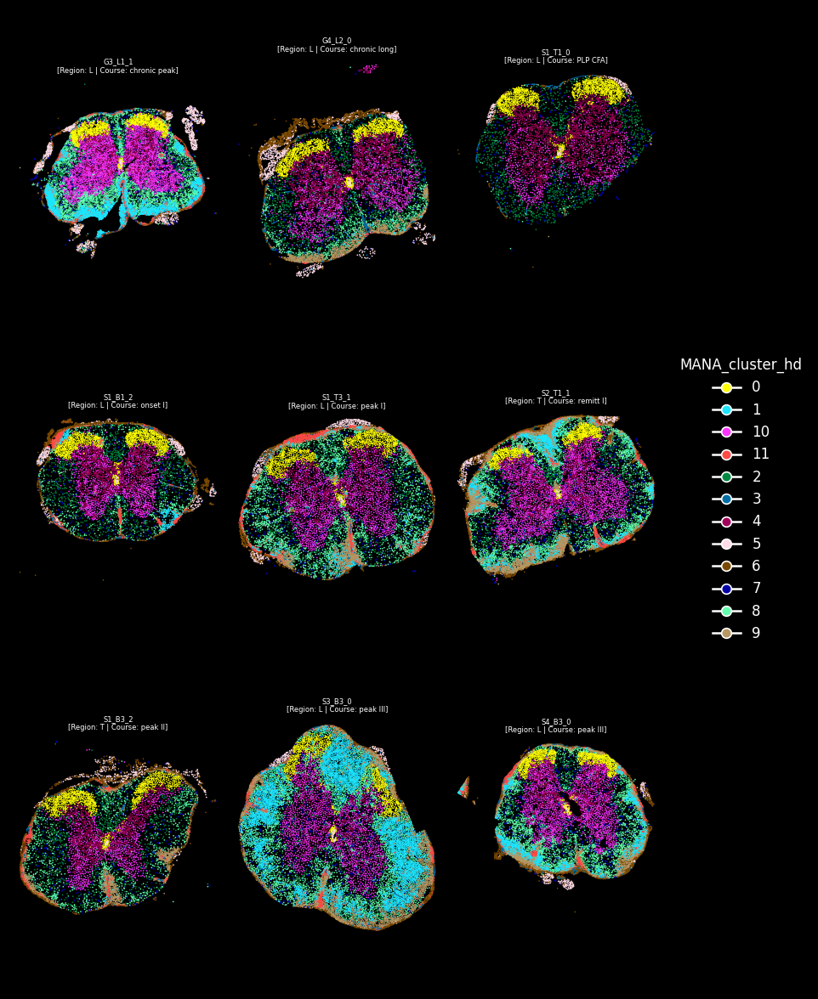

In [87]:
# usage
plot_spatial_compact_fast(
    ad,
    color="MANA_cluster_hd",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    #highlight=['4','5']
)

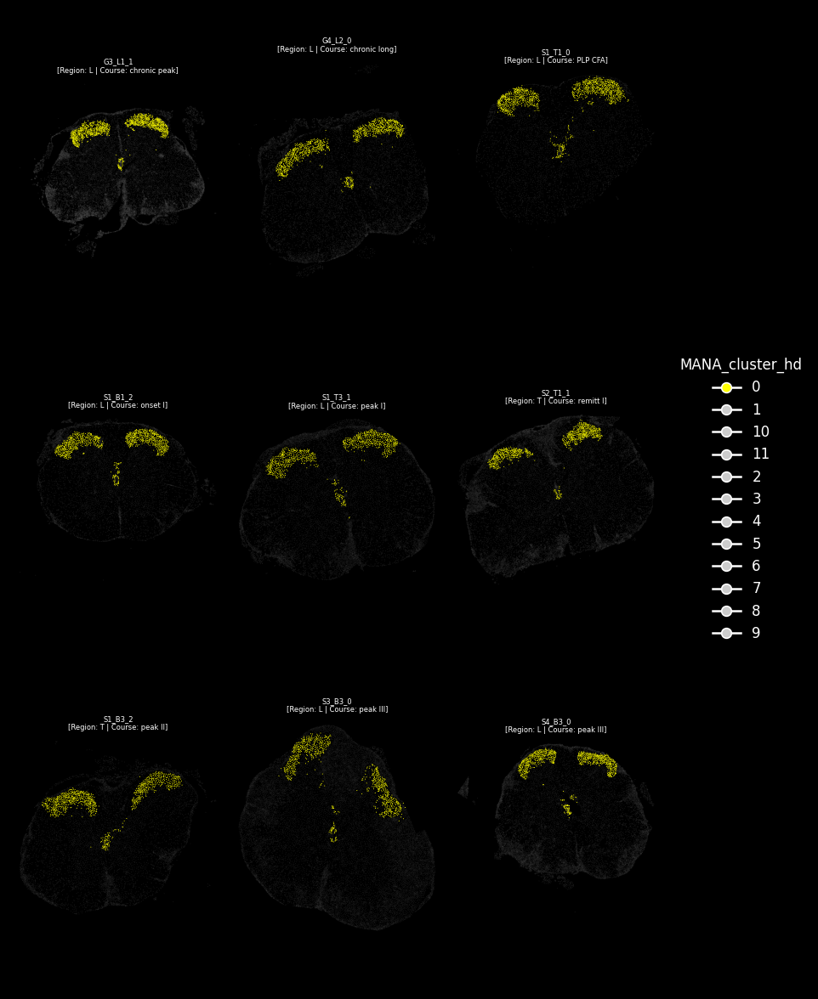

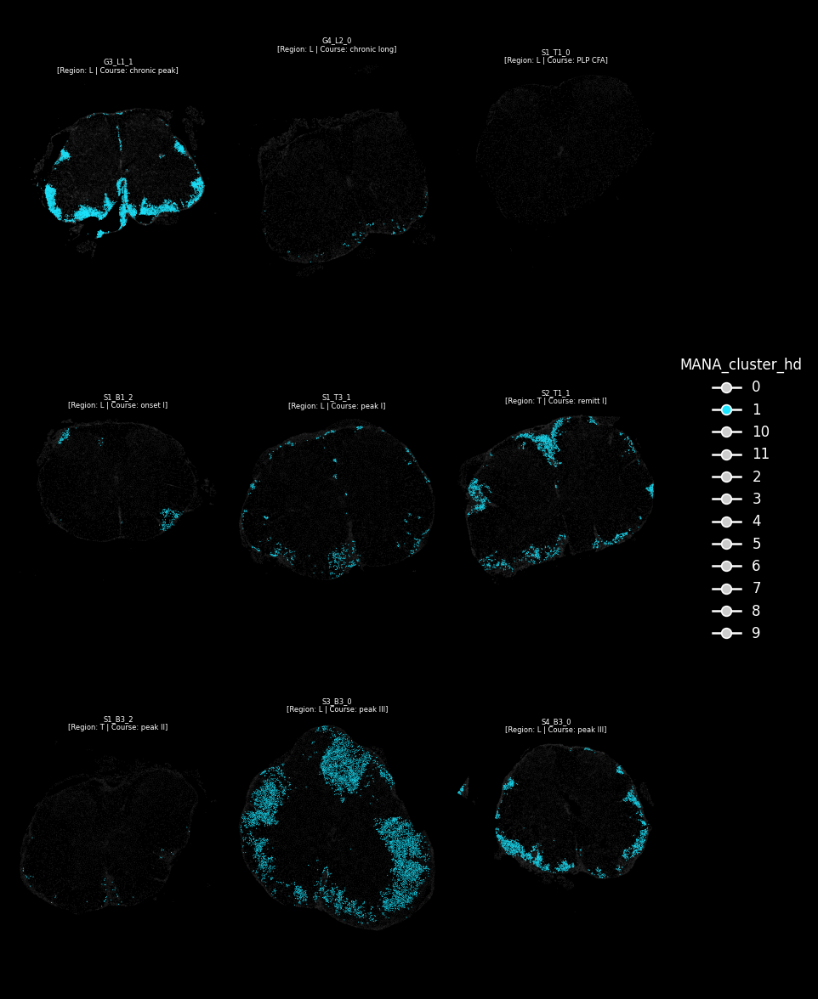

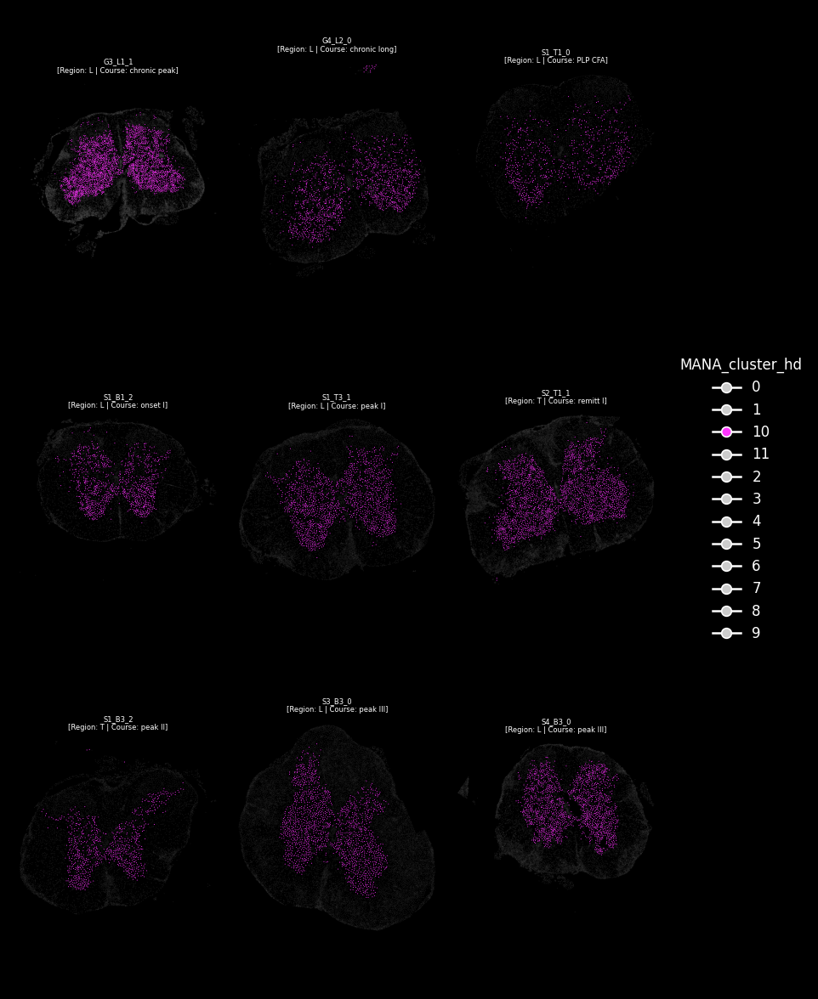

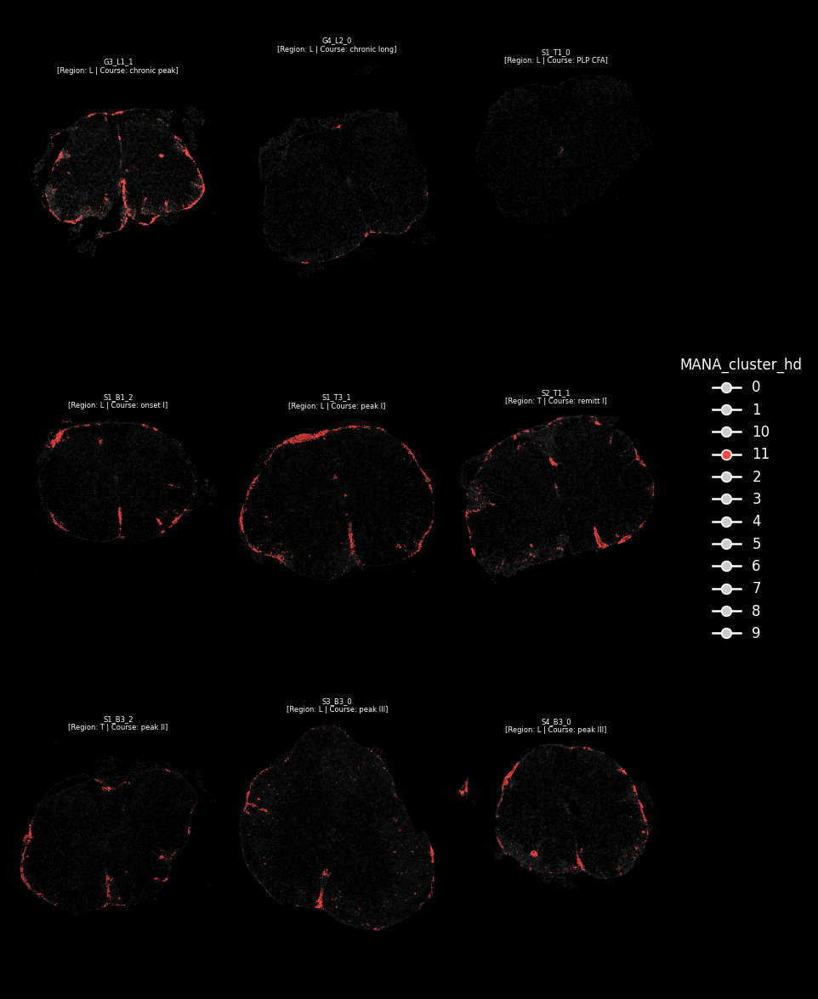

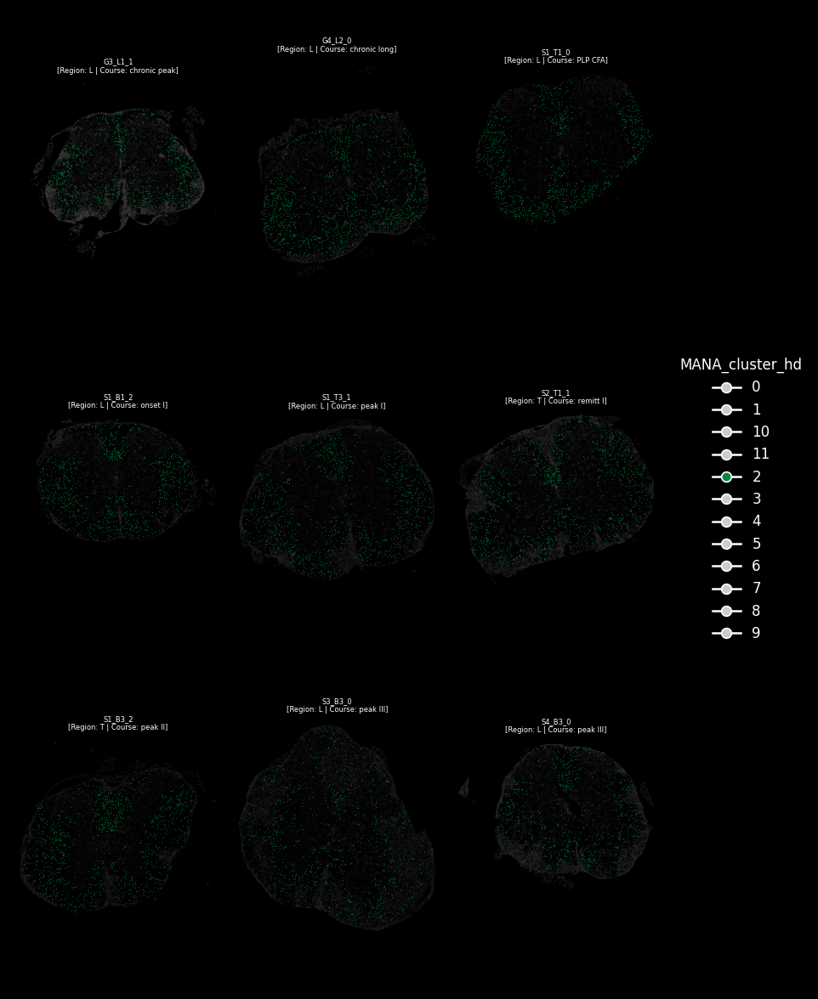

...

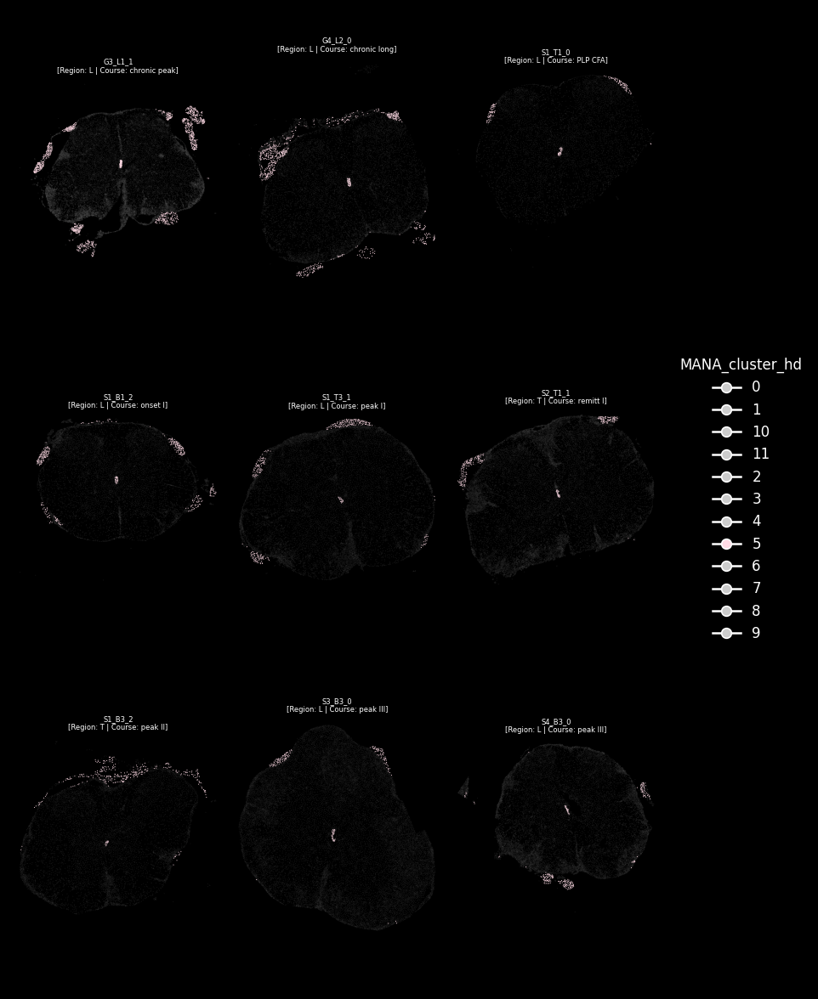

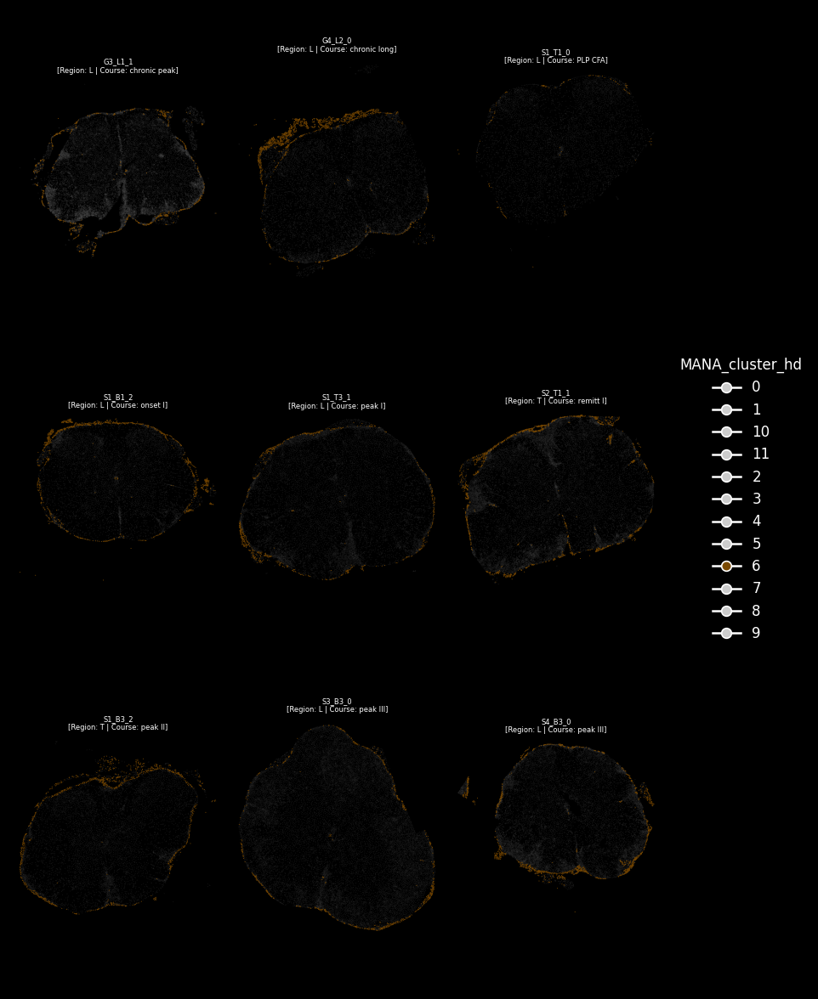

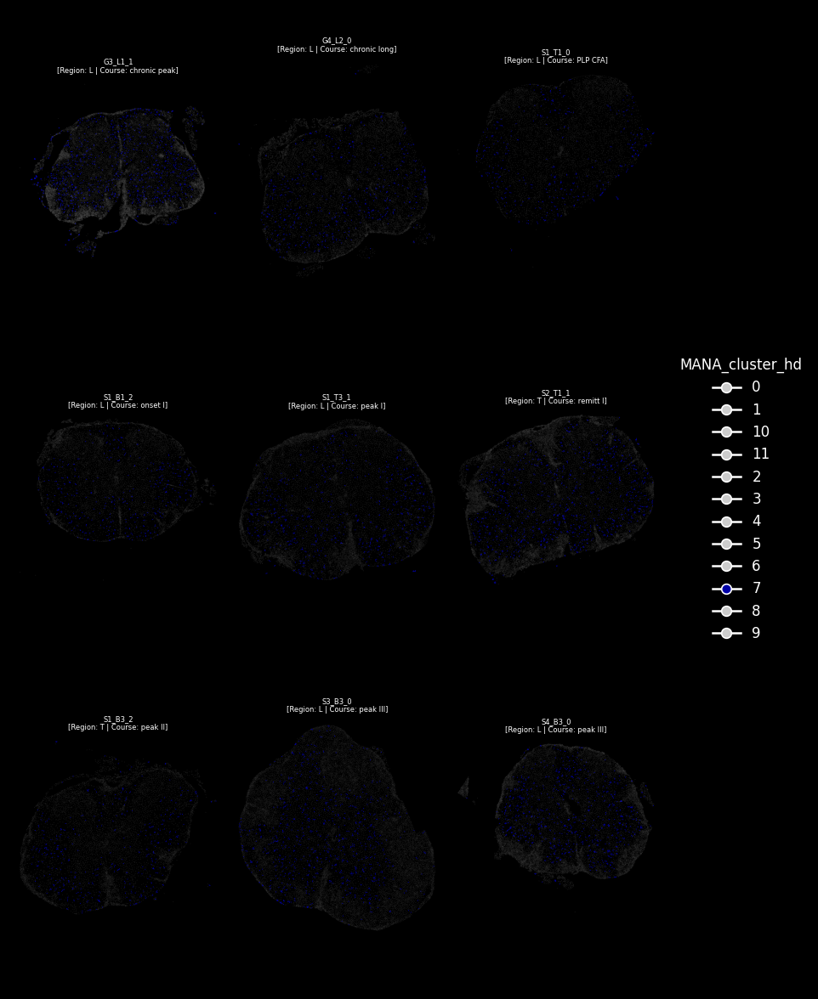

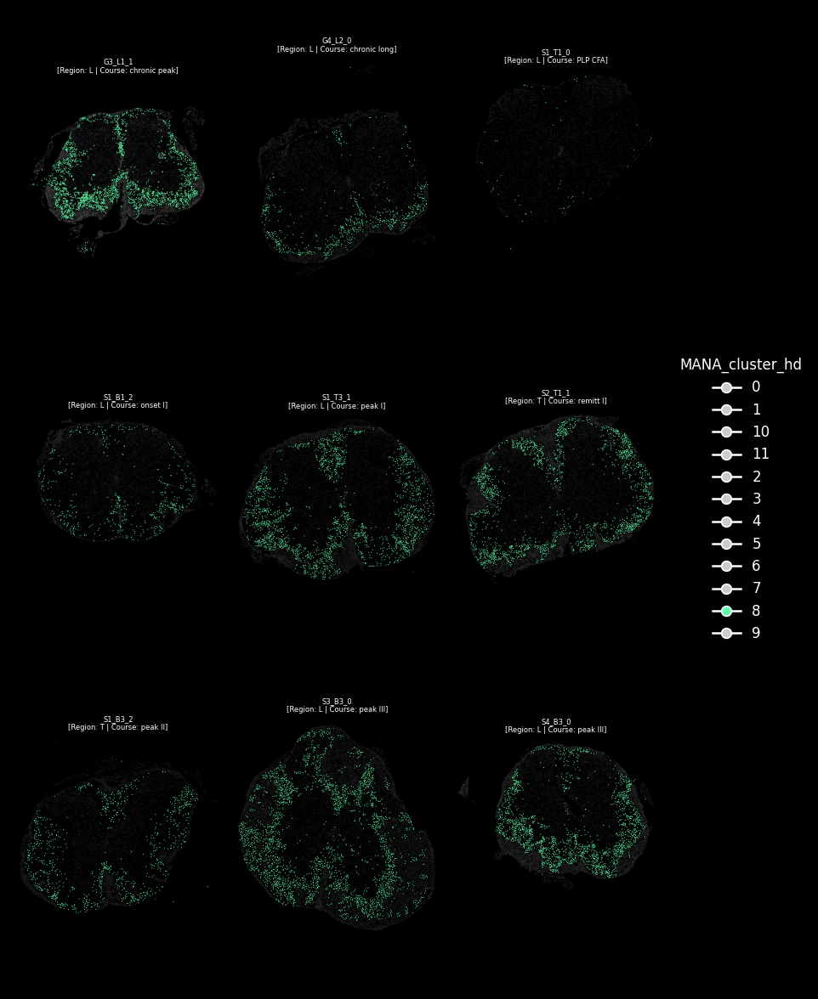

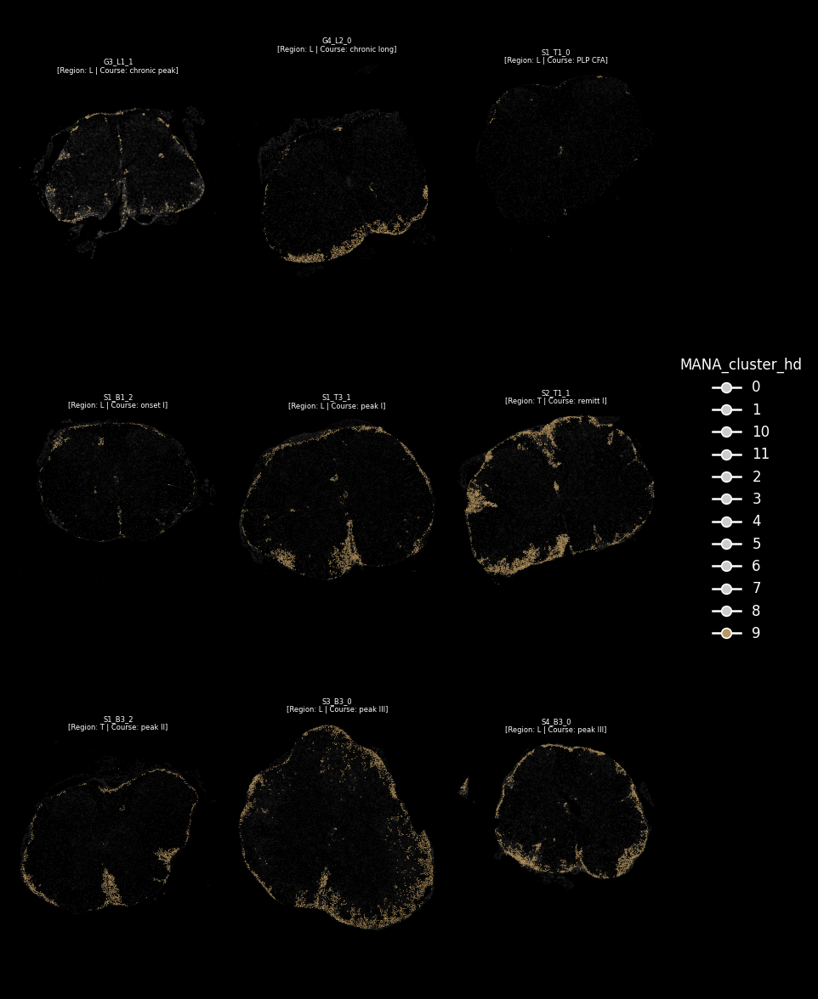

In [89]:
ad.obs['MANA_cluster_hd'] = ad.obs['MANA_cluster_hd'].astype('category')
for cluster in ad.obs['MANA_cluster_hd'].cat.categories:
    # usage
    plot_spatial_compact_fast(
        ad,
        color="MANA_cluster_hd",
        groupby="sample_id",
        spot_size=0.4,
        cols=3,
        height=10,
        legend_col_width=1.0,
        background="black",
        grey_alpha=0.1,
        highlight=[cluster]
    )

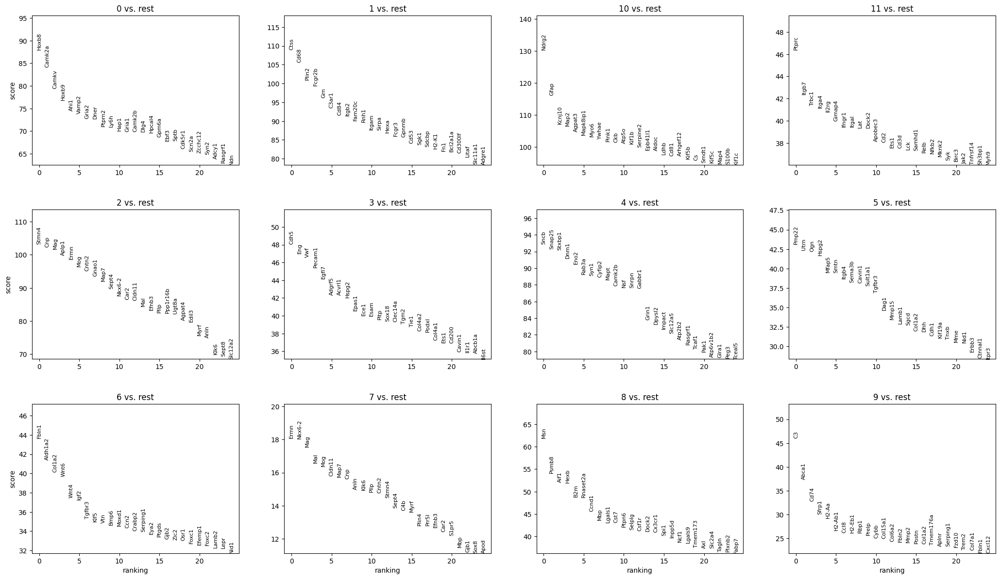

0
Hoxb8 Camk2a Camkv Hoxb9 Ahi1 Vamp2 Gria2 Dner Ptprn2 Ly6h Hap1 Gria1 Camk2b Dlg4 Hpcal4 Gpm6a Ebf3 Sptb Cdk5r1 Scn2a Zcchc12 Syn2 Adcy1 Rasgrf1 Ndn Pitpnm1 Tceal5 Gabbr1 Thra Prrc2b
 
1
Ctss Cd68 Plin2 Fcgr2b Grn C3ar1 Cd84 Itgb2 Fam20c Rnh1 Itgam Sirpa Hexa Fcgr3 Gpnmb Cd53 Sgk1 Sdcbp H2-K1 Fn1 Bcl2a1a Cd300lf Litaf Slc11a1 Adgre1 Cxcl16 Cybb Msr1 Csf2rb2 Ptpn6
 
10
Ndrg2 Gfap Kcnj10 Map2 Agpat3 Mapk8ip1 Myo6 Ywhae Pink1 Ckb Atp5o Kif1b Serpine2 Epb41l1 Aldoc Ldhb Cd81 Arhgef12 Kif5b Cs Smdt1 Kif5c Map4 S100b Kif1c Mt2 Atp5f1 Tsc22d4 Adora1 Acsl6
 
11
Ptprc Itgb7 Trbc1 Itga4 Il2rg Gimap4 Ifngr1 Itgal Lat Dock2 Apobec3 Cd2 Ets1 Cd3d Lck Samhd1 Relb Nfkb2 Mknk2 Syk Birc3 Jak2 Tnfrsf14 Sh3bp1 Myh9 Il2rb Fam107b Nlrc5 H2-Eb1 Pik3cd
 
2
Stmn4 Cnp Mag Aplp1 Ermn Mog Cntn2 Gnao1 Map7 Sept4 Nkx6-2 Car2 Cldn11 Mal Efnb3 Pllp Ppp1r16b Ugt8a Agpat4 Edil3 Myrf Anln Klk6 Sept8 Slc12a2 Dip2a Prr5l Fgfr2 C4b Mbp
 
3
Cdh5 Eng Vwf Pecam1 Egfl7 Adgrf5 Acvrl1 Hspg2 Epas1 Ece1 Esam Pltp Sox18 Clec14a 

In [92]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(ad, groupby="MANA_cluster_hd", method="t-test")
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(ad, group=None)
markers.head()
marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

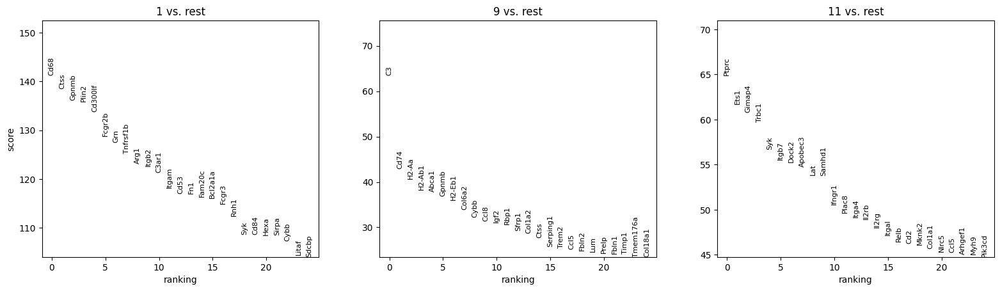

1
Cd68 Ctss Gpnmb Plin2 Cd300lf Fcgr2b Grn Tnfrsf1b Arg1 Itgb2 C3ar1 Itgam Cd53 Fn1 Fam20c Bcl2a1a Fcgr3 Rnh1 Syk Cd84 Hexa Sirpa Cybb Litaf Sdcbp Sgk1 Cxcl16 H2-K1 Cxcr4 Hmox1
 
9
C3 Cd74 H2-Aa H2-Ab1 Abca1 Gpnmb H2-Eb1 Col6a2 Cybb Ccl8 Igf2 Rbp1 Sfrp1 Col1a2 Ctss Serping1 Trem2 Ccl5 Fbln2 Lum Prelp Fbln1 Timp1 Tmem176a Col18a1 Col4a1 A2m Col1a1 Pltp Col15a1
 
11
Ptprc Ets1 Gimap4 Trbc1 Syk Itgb7 Dock2 Apobec3 Lat Samhd1 Ifngr1 Plac8 Itga4 Il2rb Il2rg Itgal Relb Cd2 Mknk2 Col1a1 Nlrc5 Ccl5 Arhgef1 Myh9 Pik3cd H2-Eb1 H2-K1 Ciita Jak3 Selplg
 


In [95]:
import scanpy as sc

key = "MANA_cluster_hd"              # <-- change to your cluster column
groups = ['1','9','11']          # <-- your three cluster labels (strings)

sc.tl.rank_genes_groups(
    ad,
    groupby=key,
    groups=groups,
    reference="rest",             # each group vs all other cells
    method="wilcoxon",
    pts=True,                     # add fraction expressing
)
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

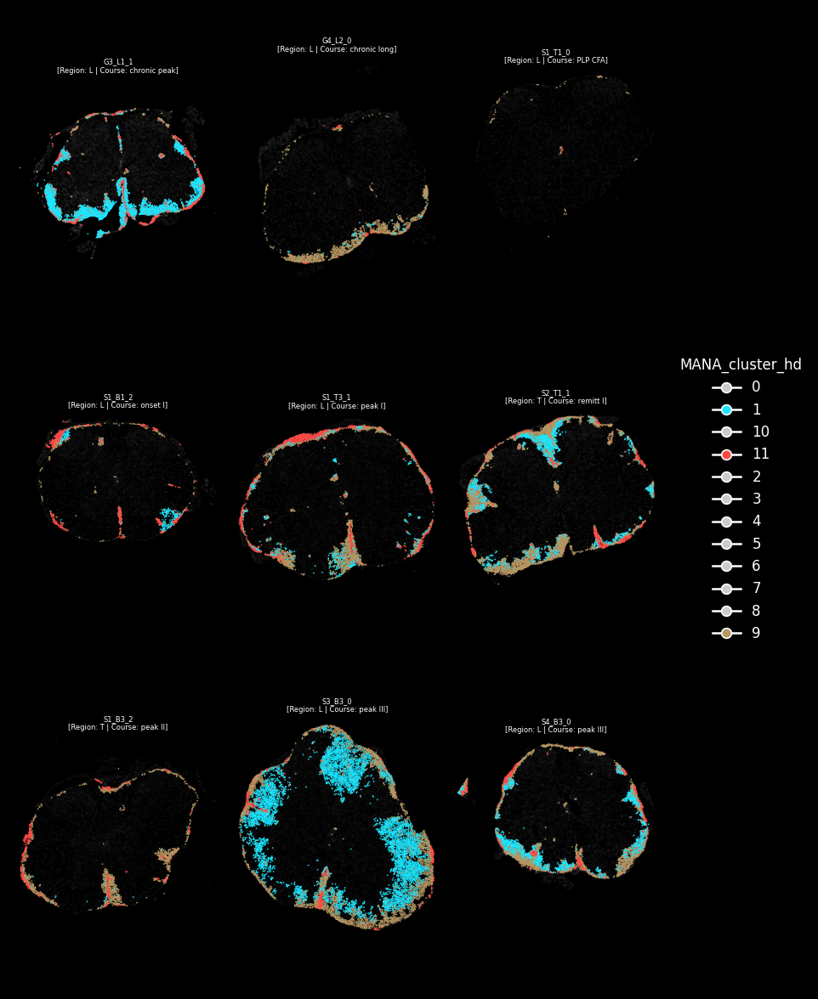

In [97]:
# usage
groups = ['1','9','11']          # <-- your three cluster labels (strings)

plot_spatial_compact_fast(
    ad,
    color="MANA_cluster_hd",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    highlight=groups
)

In [99]:
from sklearn.cluster import MiniBatchKMeans

X = ad.obsm["X_scVI"]

km = MiniBatchKMeans(
    n_clusters=12,
    random_state=0,
    batch_size=8192,
    n_init=10,
)

ad.obs["scVI_only"] = km.fit_predict(X).astype(str)

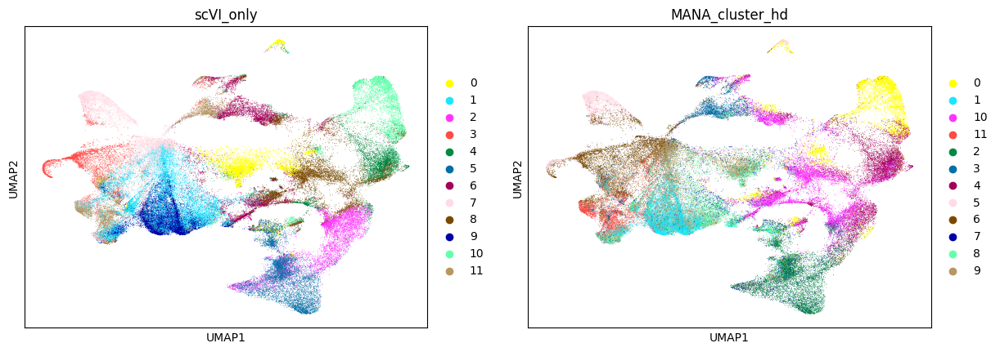

In [104]:
sc.pl.umap(ad, color = ['scVI_only','MANA_cluster_hd'])

In [106]:
X = ad.obsm["X_mana_hd"].astype(np.float32)
X = (X - X.mean(0)) / (X.std(0) + 1e-8)
ad.obsm["X_mana_hd_z"] = X

In [117]:
ad.obsm["X_mana_hd_z"]

array([[-0.13021639, -0.19574733, -0.0622809 , ...,  0.06431493,
        -0.0988339 , -0.10466982],
       [-0.12125611,  2.3330953 , -0.9248277 , ...,  0.06431493,
        -0.0988339 , -0.10466982],
       [ 0.13535517, -0.51184165, -0.31103694, ..., -5.2348824 ,
        -2.8477437 , -0.48576024],
       ...,
       [-0.32232103, -0.29868683, -0.13899733, ..., -0.945606  ,
        -0.23755072,  1.0611964 ],
       [-1.3015366 ,  0.20267615,  0.19770782, ..., -0.9588502 ,
         0.17053804,  1.5746887 ],
       [-0.86009824,  0.01588453,  0.07525381, ..., -1.0274452 ,
         0.26794568,  1.7515732 ]], shape=(107228, 56), dtype=float32)

In [118]:
from sklearn.cluster import MiniBatchKMeans

X = ad.obsm["X_mana_hd_z"]

km = MiniBatchKMeans(
    n_clusters=15,
    random_state=0,
    batch_size=8192,
    n_init=10,
)

ad.obs["MANA_cluster_hd_Z"] = km.fit_predict(X).astype(str)

In [121]:
del ad.uns['MANA_cluster_hd_Z_colors']

In [124]:
ad.obs['MANA_cluster_hd_Z'] 

cell_id
npbjhhhp-1    10
ekkkkjhg-1    10
ekmlkkdo-1     5
ekmkkhfi-1     5
ekkgfobi-1     5
              ..
nckmikdf-1     7
nclalckk-1     7
nckpdmcl-1     7
nclchghp-1     7
nckebnmh-1     7
Name: MANA_cluster_hd_Z, Length: 107228, dtype: category
Categories (15, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [126]:
key = "MANA_cluster_hd_Z"

In [129]:
cats = ad.obs[key].cat.categories
cats_sorted = sorted(cats, key=lambda x: int(x))

ad.obs[key] = ad.obs[key].cat.reorder_categories(cats_sorted, ordered=True)

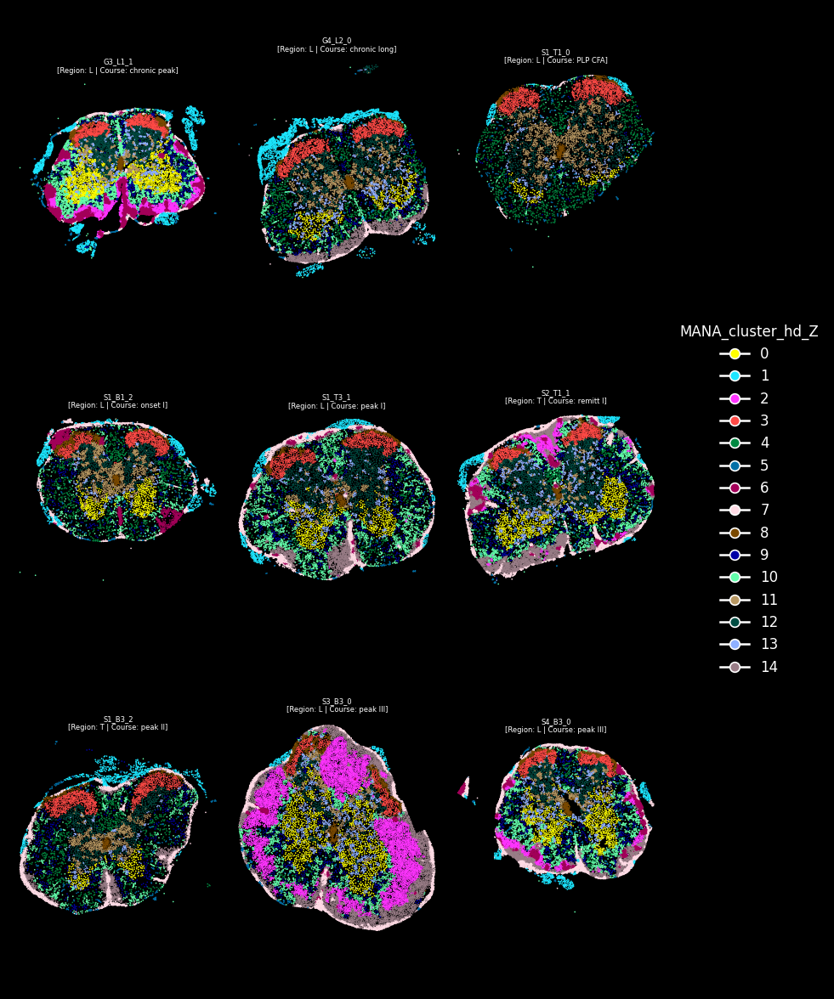

In [130]:
# usage
plot_spatial_compact_fast(
    ad,
    color="MANA_cluster_hd_Z",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    #highlight=['4','5']
)

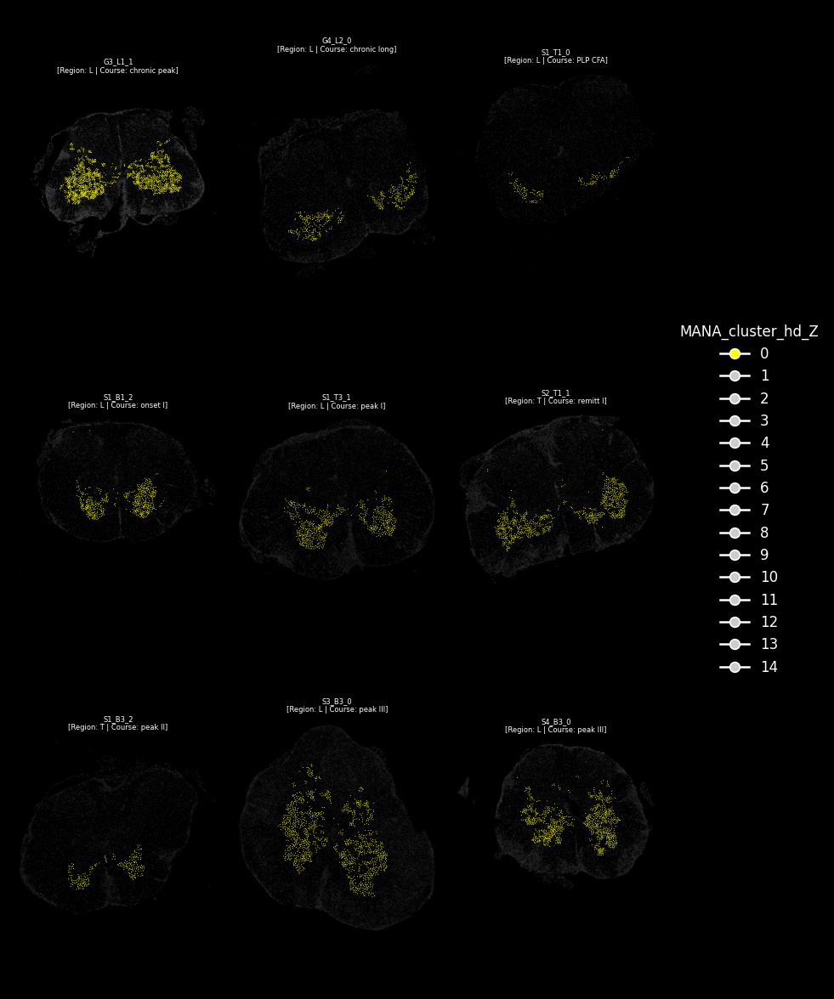

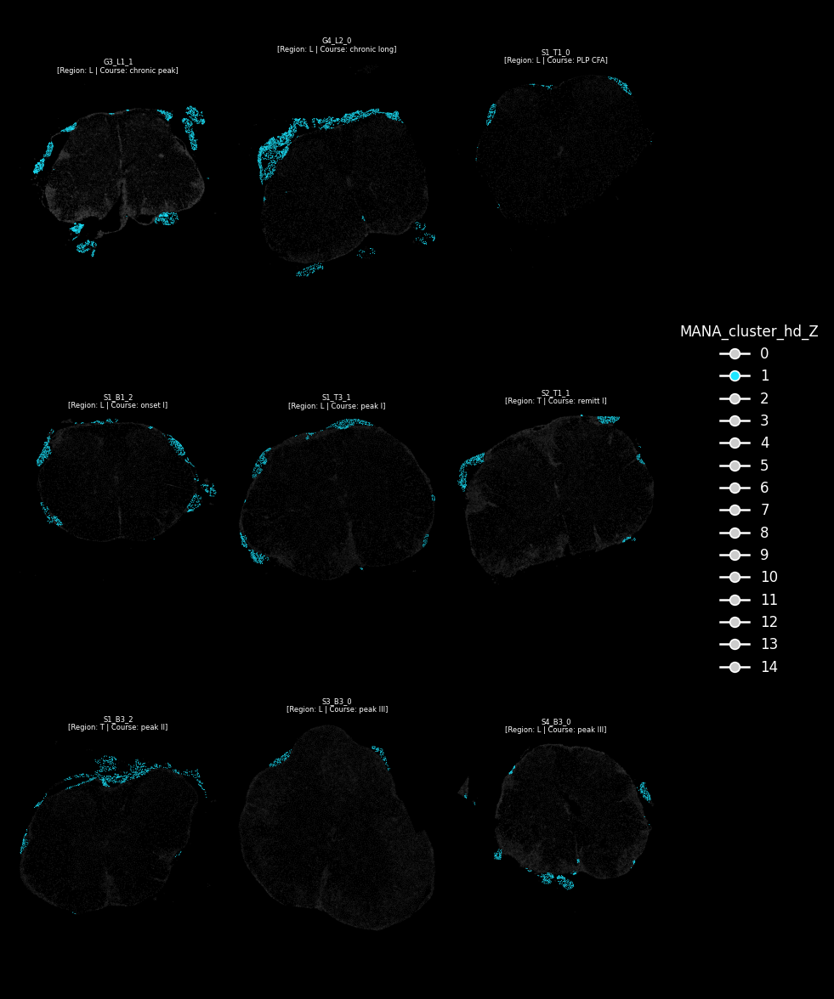

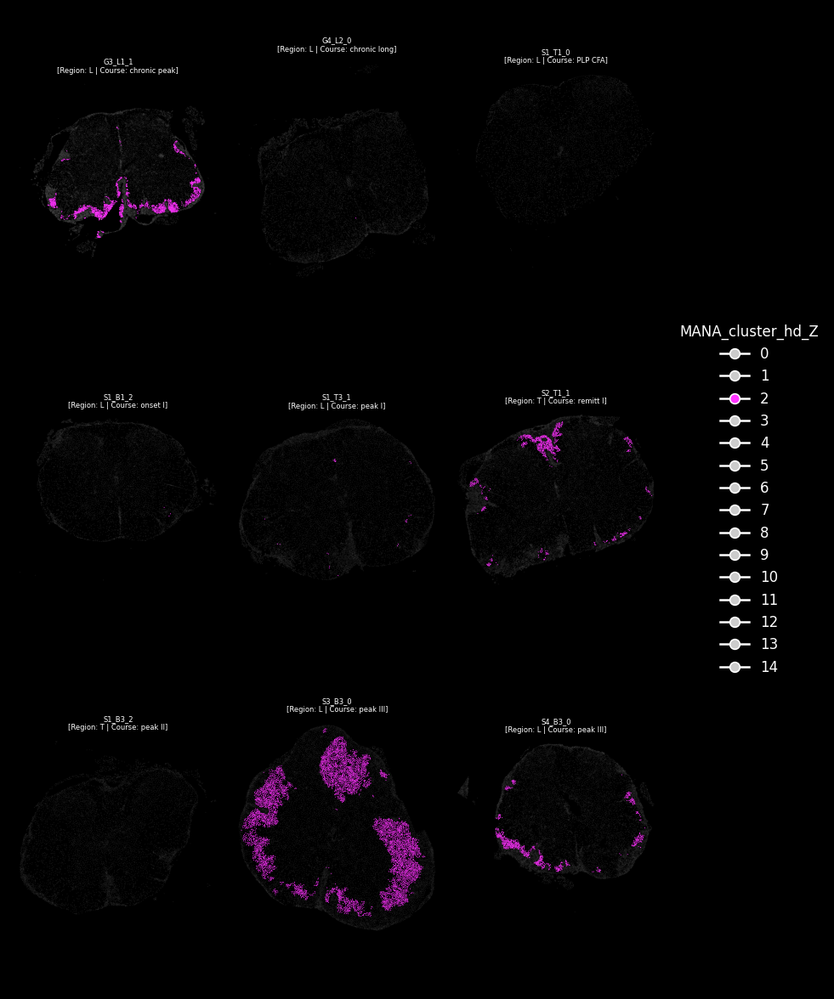

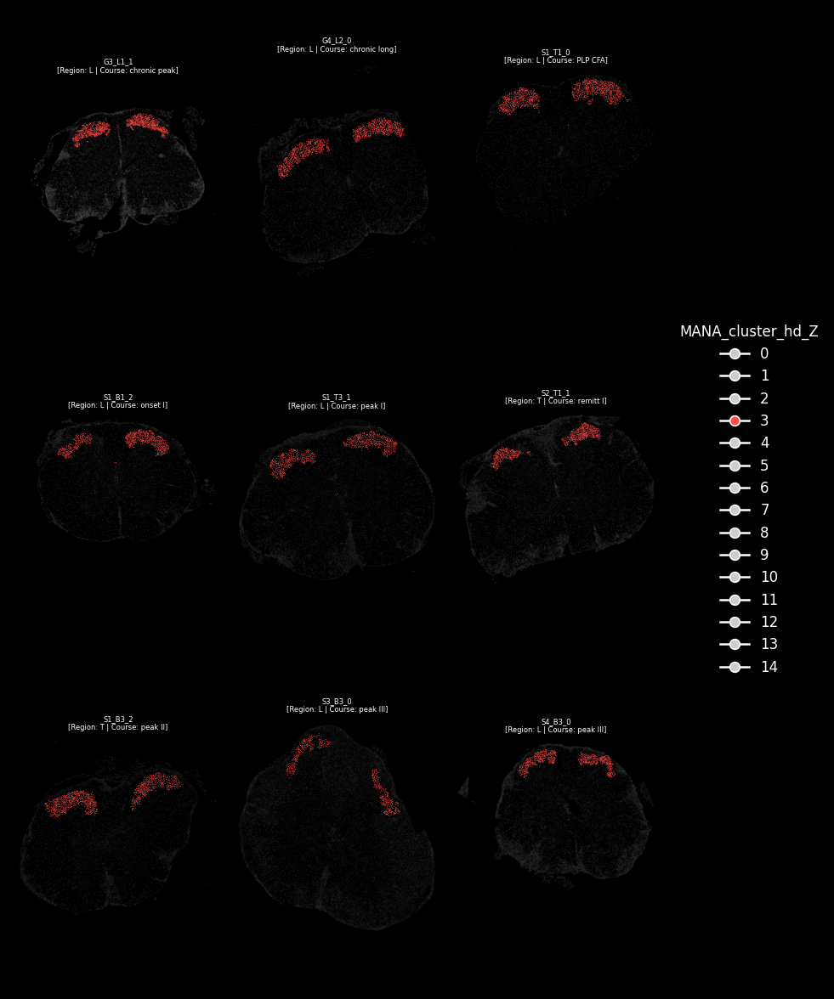

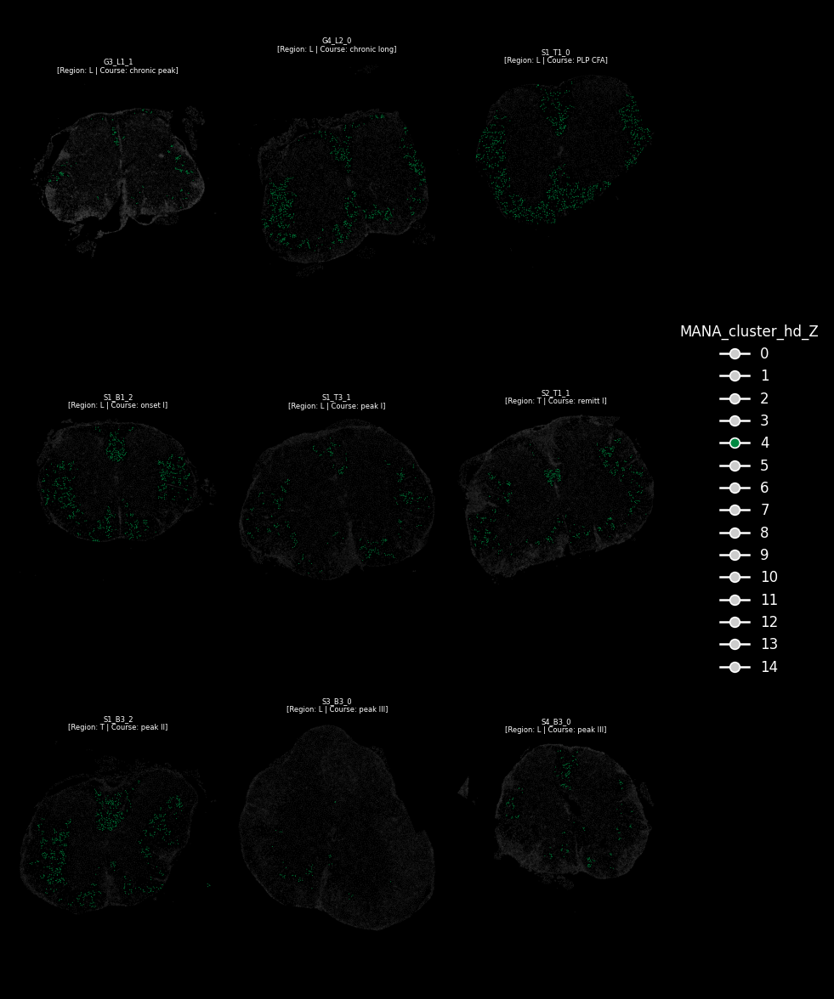

...

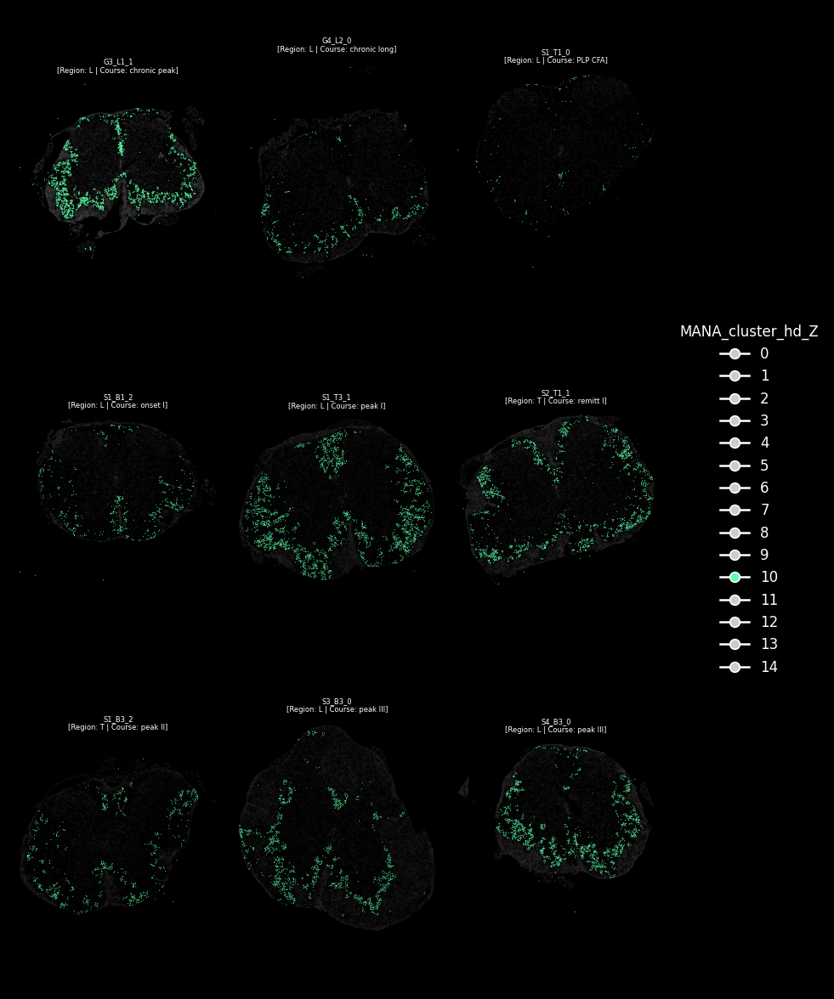

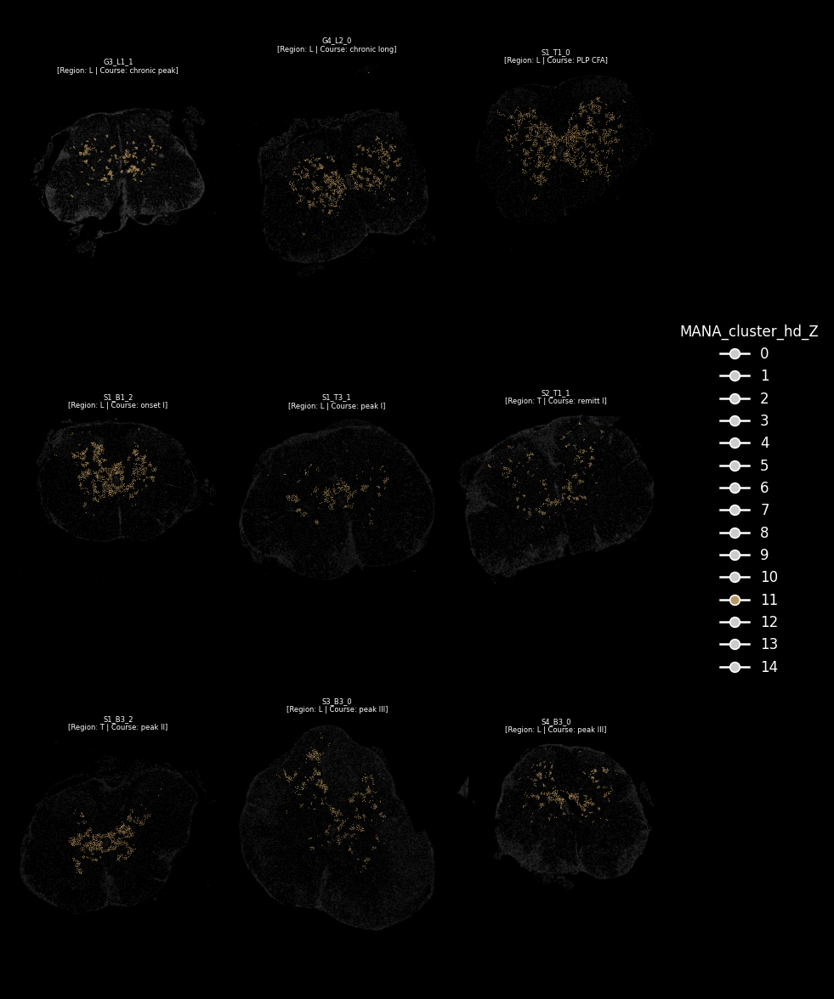

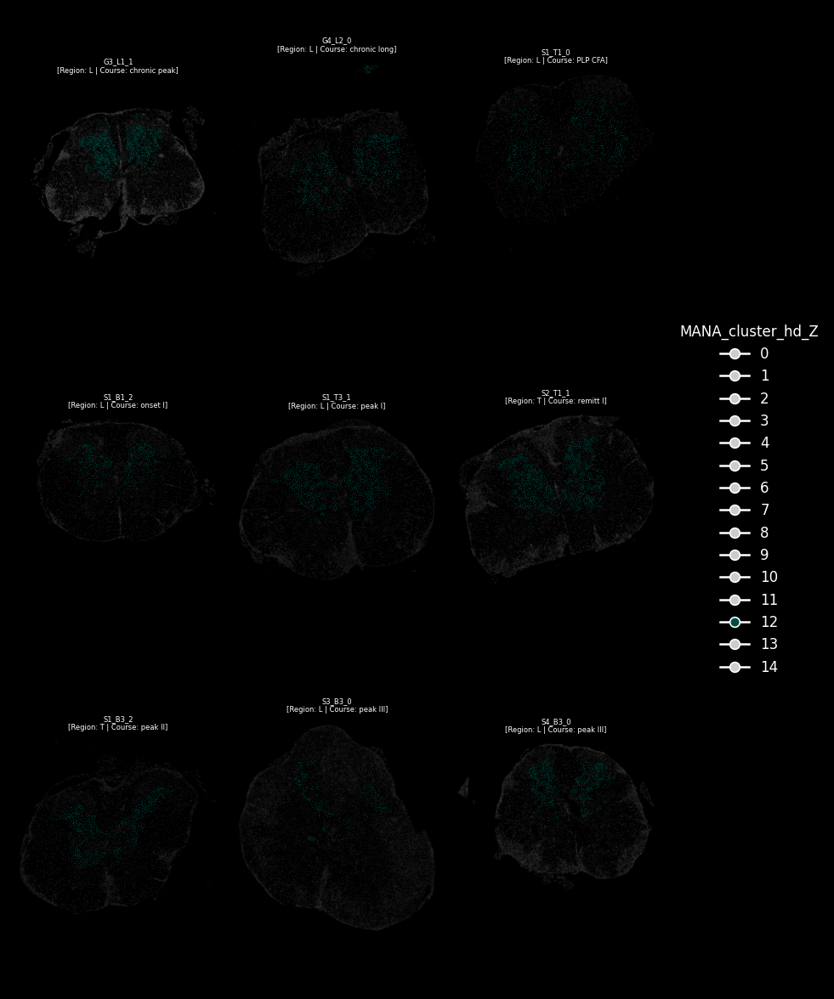

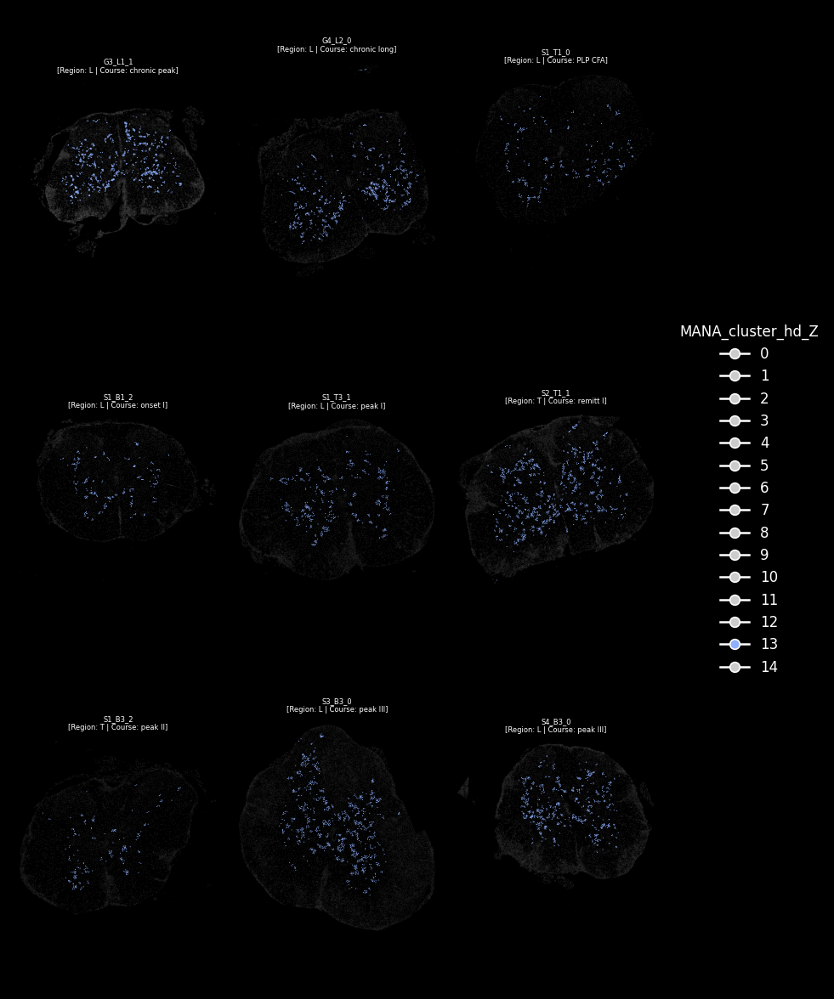

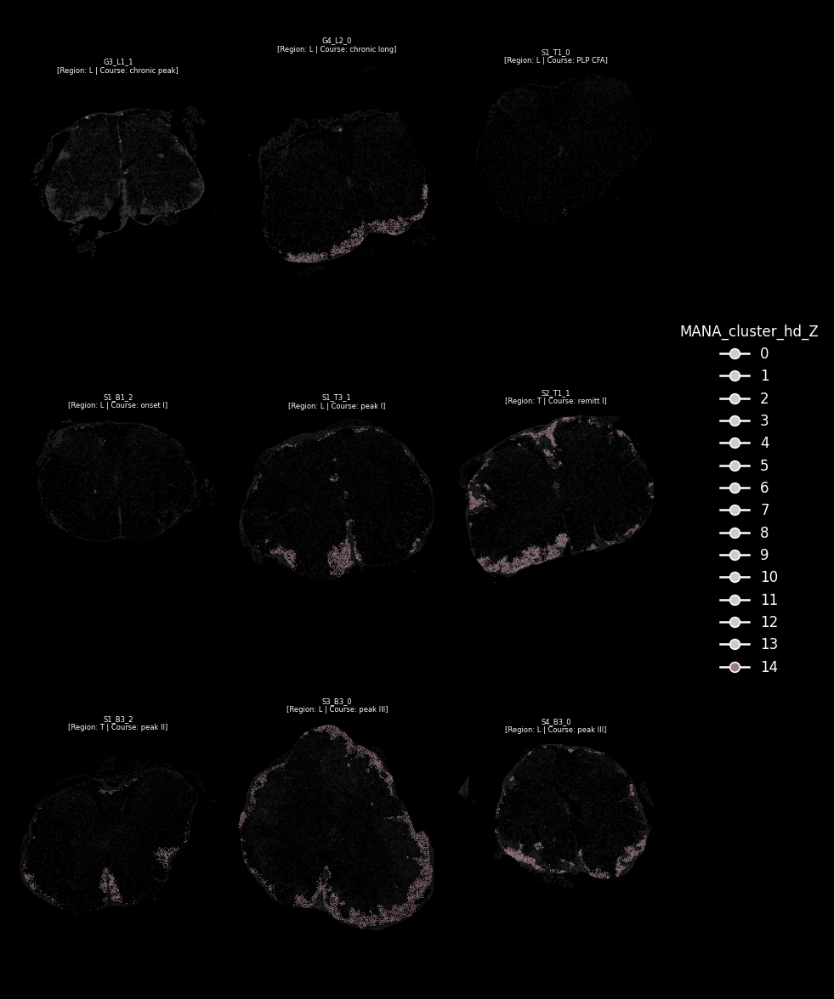

In [131]:
ad.obs['MANA_cluster_hd_Z'] = ad.obs['MANA_cluster_hd_Z'].astype('category')
for cluster in ad.obs['MANA_cluster_hd_Z'].cat.categories:
    # usage
    plot_spatial_compact_fast(
        ad,
        color="MANA_cluster_hd_Z",
        groupby="sample_id",
        spot_size=0.4,
        cols=3,
        height=10,
        legend_col_width=1.0,
        background="black",
        grey_alpha=0.1,
        highlight=[cluster]
    )

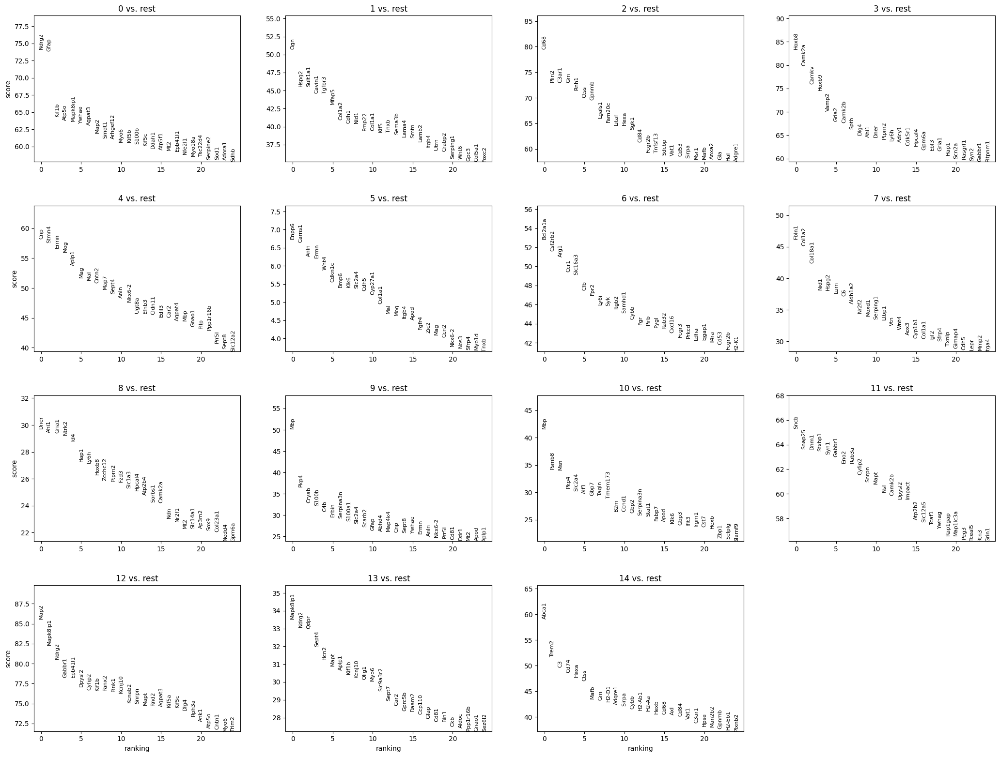

0
Ndrg2 Gfap Kif1b Atp5o Mapk8ip1 Ywhae Agpat3 Map2 Smdt1 Arhgef12 Myo6 Kif5b S100b Kif5c Ddah1 Atp5f1 Mt2 Epb41l1 Nfe2l1 Myo18a Tsc22d4 Serpine2 Sod1 Adora1 Sdhb Mpc1 Ldhb Cs Dpysl2 Ckb
 
1
Ogn Hspg2 Sult1a1 Cavin1 Tgfbr3 Mfap5 Col1a2 Cdh1 Nid1 Pmp22 Col1a1 Klf5 Tnxb Sema3b Lama4 Smtn Lamb2 Itgb4 Utrn Crabp2 Serping1 Wnt6 Gpc3 Col5a1 Foxc2 Eya2 Efemp1 Foxc1 Sgcd Dag1
 
2
Cd68 Plin2 C3ar1 Grn Rnh1 Ctss Gpnmb Lgals1 Fam20c Litaf Hexa Sgk1 Cd84 Fcgr2b Tnfsf13 Sdcbp Vat1 Cd53 Sirpa Msr1 Mafb Anxa2 Gla Hal Adgre1 Il7r Lamp1 Tlr13 Cd300lf Itgb2
 
3
Hoxb8 Camk2a Camkv Hoxb9 Vamp2 Gria2 Camk2b Sptb Dlg4 Ahi1 Dner Ptprn2 Ly6h Adcy1 Cdk5r1 Hpcal4 Gpm6a Ebf3 Gria1 Hap1 Scn2a Rasgrf1 Syn2 Gabbr1 Pitpnm1 Slc12a5 Cdk5r2 Zcchc12 Map2 Tceal5
 
4
Cnp Stmn4 Ermn Mog Aplp1 Mag Mal Cntn2 Map7 Sept4 Anln Nkx6-2 Ugt8a Efnb3 Cldn11 Edil3 Car2 Agpat4 Mbp Gnao1 Pllp Ppp1r16b Prr5l Sept8 Slc12a2 Sox8 Fgfr2 Myrf Cpox Myo1d
 
5
Enpp6 Carns1 Anln Ermn Wnt4 Cdkn1c Bmp6 Klk6 Slc2a4 Cdh5 Cyp27a1 Col1a1 Mal Mog Itgb4

In [132]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(ad, groupby="MANA_cluster_hd_Z", method="t-test")
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(ad, group=None)
markers.head()
marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

In [134]:
ad.obsm['X_scVI']

array([[-0.11210716, -0.21542585, -0.06150334, ..., -0.00953463,
         0.32625836, -1.246501  ],
       [-0.10250437,  2.39372   , -0.99135435, ..., -0.9478553 ,
        -0.7952361 , -0.97680736],
       [ 0.17250723, -0.5415577 , -0.3296697 , ..., -0.04310307,
         0.06897342, -1.0126302 ],
       ...,
       [-0.31798664, -0.32163417, -0.14420593, ...,  0.582712  ,
         0.08217716, -1.5758514 ],
       [-1.3674169 ,  0.1956495 ,  0.2187722 , ...,  1.4665359 ,
        -0.29273182, -1.6027601 ],
       [-0.8943252 ,  0.00292635,  0.08676316, ...,  1.1099375 ,
        -0.49620295, -1.453564  ]], shape=(107228, 10), dtype=float32)

In [ ]:
sc.pp.neighbors(ad, use_rep="X_scVI")
sc.tl.umap(ad)


In [137]:
ad

AnnData object with n_obs × n_vars = 107228 × 5101
    obs: 'cell', 'centroid_x', 'centroid_y', 'centroid_z', 'component', 'volume', 'surface_area', 'scale', 'region', 'sample_id', 'proseg_cluster', 'output_folder', 'Num', 'n_genes', 'n_counts', 'louvain_0.5', 'louvain_1', 'louvain_1.5', 'louvain_2', 'louvain_2.5', 'louvain_3', 'louvain_3.5', 'Cluster', 'Level1', 'Level2', 'Level3', 'Level3.1', 'grid_label', 'rbd_domain', 'rbd_domain_0.1', 'rbd_domain_0.2', 'rbd_domain_0.3', 'rbd_domain_0.5', 'rbd_domain_0.6', 'rbd_domain_0.7', 'rbd_domain_0.8', 'rbd_domain_0.9', 'rbd_domain_1.1', 'rbd_domain_1', 'rbd_domain_1.25', 'rbd_domain_1.4', 'rbd_domain_1.5', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'leiden_3.5', 'sample_name', 'course', 'condition', 'model', 'cytetype_annotation_louvain_3.5', 'cytetype_cellOntologyTerm_louvain_3.5', 'cluster_id', 'author_label', 'annotation', 'Class', 'state', 'CL_term', 'CL_term_id', 'confidence', 'author_label_similarity_

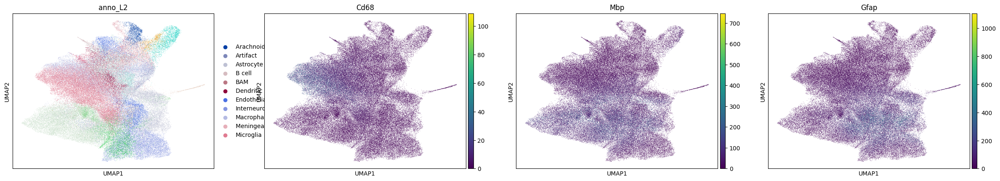

In [138]:
sc.pl.umap(ad, color=["anno_L2", "Cd68", "Mbp", "Gfap"])